In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.max_columns', None)  
pd.set_option('display.expand_frame_repr', False)
pd.set_option('max_colwidth', None)

import pandas_profiling
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import RobustScaler
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split

from xgboost import XGBClassifier
from catboost import CatBoostClassifier

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/credit-card-customers/BankChurners.csv


In [2]:
df = pd.read_csv('/kaggle/input/credit-card-customers/BankChurners.csv')
df = df.drop(['Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2', 'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1'], axis=1)
df

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


In [3]:
#let's explore our features

profile = pandas_profiling.ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/35 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

We have 6 categorical and 15 numerical columns, no missing values. The dataset is imbalanced, there are 8500 and 1627 of existing and attrited clients respectively. Customer age distribution is normal, the numbers of femae and male clients are roughly equal. Numbers of married and single clients are also quite close. 
The 'less than $40k' category incudes the biggest quantity of clients in this dataset. Most of the clients have Blue card, 555 have Silver one, 16 have Gold and only 20 clients have Platinum card.   Let's have a look at these and other features with respect to Attrition Flag if we can find some interesting patterns there.

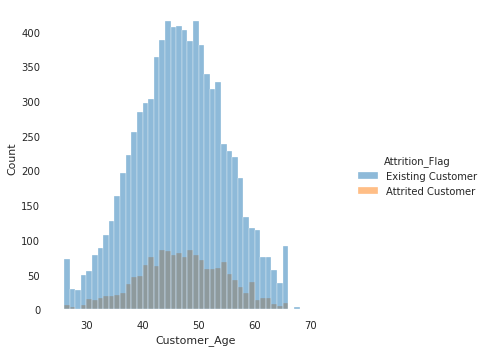

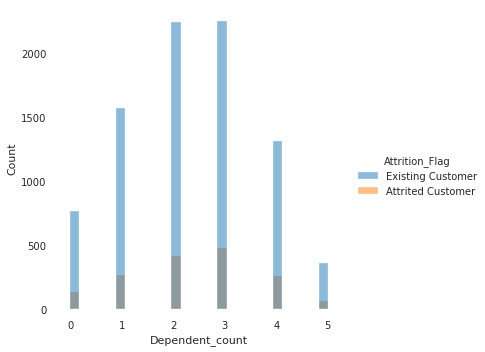

In [4]:
sns.displot(df, x="Customer_Age", hue="Attrition_Flag")
sns.displot(df, x="Dependent_count", hue="Attrition_Flag")

Here attrition is normally distributed, so we may think about excluding these features after looking at PPS matrix later.

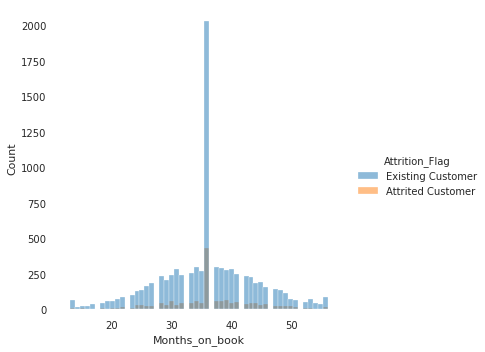

In [5]:
sns.displot(df, x="Months_on_book", hue="Attrition_Flag")

Months on book looks very unsual, like there are a lot (2000) of clients who spent here exactly 36 months or so and almost 500 of them are attrited.

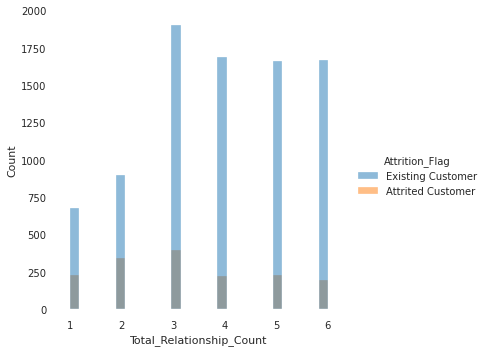

In [6]:
sns.displot(df, x="Total_Relationship_Count", hue="Attrition_Flag")

As we can't talk about nmal distribution here (after 3 number of attrited customers is pretty the same for 4, 5 and 6), so, this column may be important for our model. 

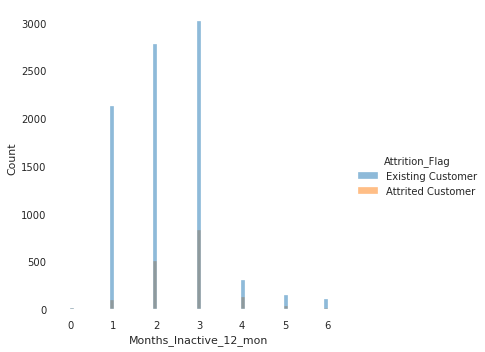

In [7]:
sns.displot(df, x="Months_Inactive_12_mon", hue="Attrition_Flag")

Clients are mostly active that can be notactive during 1-3 months period. There are a few of them who has been inanctive during 5 or6 months and surprisingly they still are existing customers.
In the graph below it is clea that the more contacts within 12 months, the highest probability for a client to attrite. 

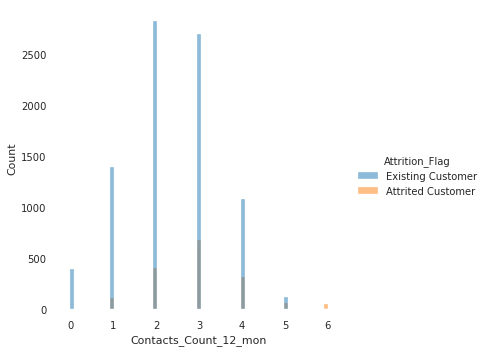

In [8]:
sns.displot(df, x="Contacts_Count_12_mon", hue="Attrition_Flag")

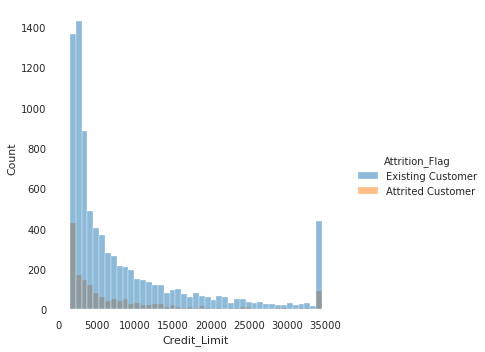

In [9]:
sns.displot(df, x="Credit_Limit", hue="Attrition_Flag")

Generally, the lower credit limit is, the higher the probablity of attrition is. There is an outlier - maximum available credit limit - 35000. Roughly 1/4 of clients with this limit are attrited.

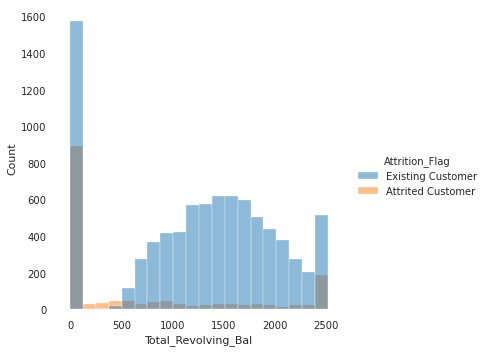

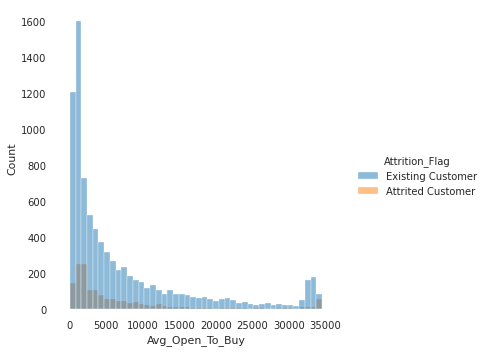

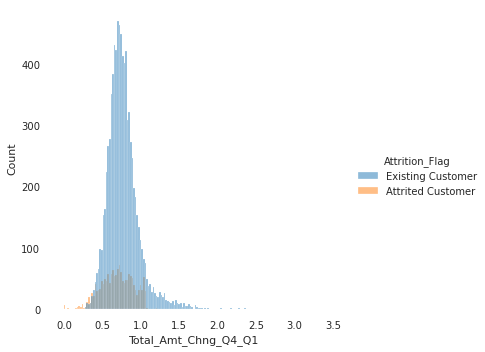

In [10]:
sns.displot(df, x="Total_Revolving_Bal", hue="Attrition_Flag")
sns.displot(df, x="Avg_Open_To_Buy", hue="Attrition_Flag")
sns.displot(df, x="Total_Amt_Chng_Q4_Q1", hue="Attrition_Flag")

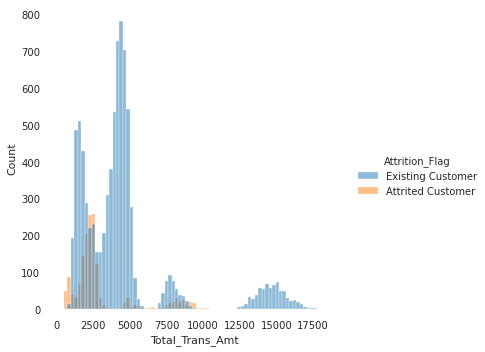

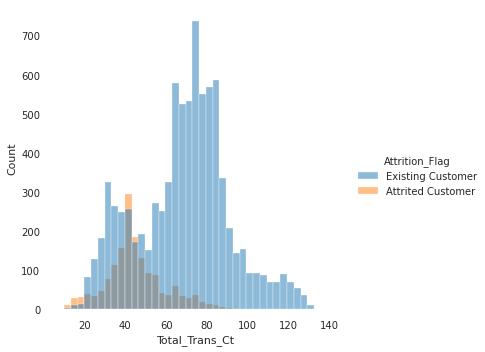

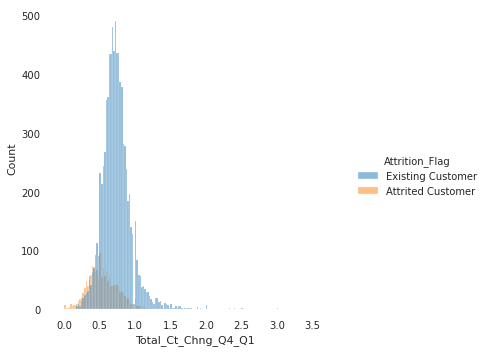

In [11]:
sns.displot(df, x="Total_Trans_Amt", hue="Attrition_Flag")
sns.displot(df, x="Total_Trans_Ct", hue="Attrition_Flag")
sns.displot(df, x="Total_Ct_Chng_Q4_Q1", hue="Attrition_Flag")

All previous graphs show that the more money customers spend the less likely they become churned. Again, with some outliers.  Seems like those people took credit once for a buying an expensive thing like a house or a flat.
Average Utilization Ratio shows that there is the highest chance for churn if this ratio equals 0.

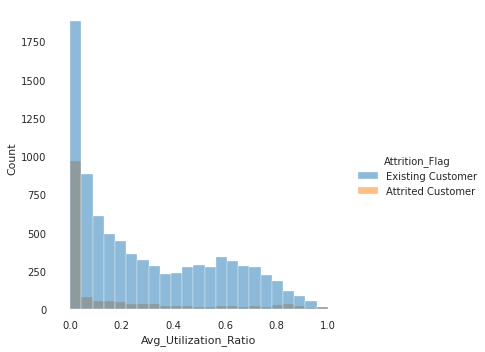

In [12]:
sns.displot(df, x="Avg_Utilization_Ratio", hue="Attrition_Flag")

<AxesSubplot:xlabel='Gender', ylabel='count'>

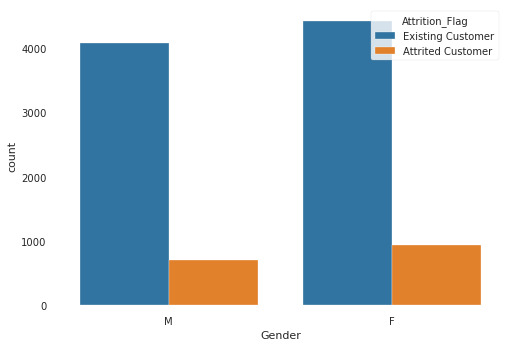

In [13]:
sns.countplot(x ='Gender', hue='Attrition_Flag', data=df)

<AxesSubplot:xlabel='Education_Level', ylabel='count'>

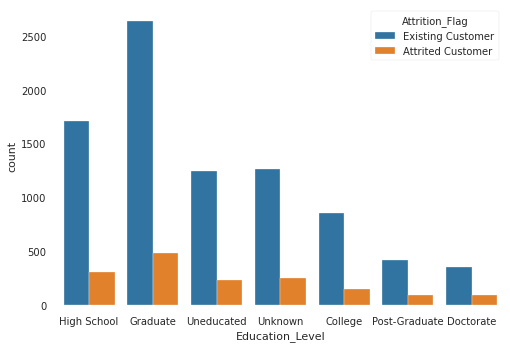

In [14]:
sns.countplot(x ='Education_Level', hue='Attrition_Flag', data=df)

Nothing unusual in Gender, Education Level and Marital Status distribution of Churned clients.

<AxesSubplot:xlabel='Marital_Status', ylabel='count'>

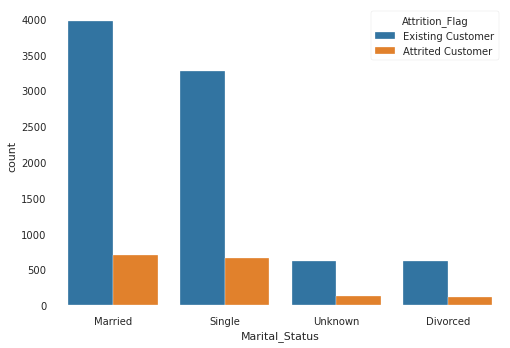

In [15]:
sns.countplot(x ='Marital_Status', hue='Attrition_Flag', data=df)

<AxesSubplot:xlabel='Income_Category', ylabel='count'>

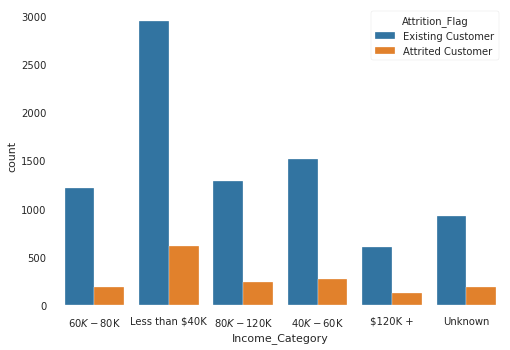

In [16]:
sns.countplot(x ='Income_Category', hue='Attrition_Flag', data=df)

<AxesSubplot:xlabel='Card_Category', ylabel='count'>

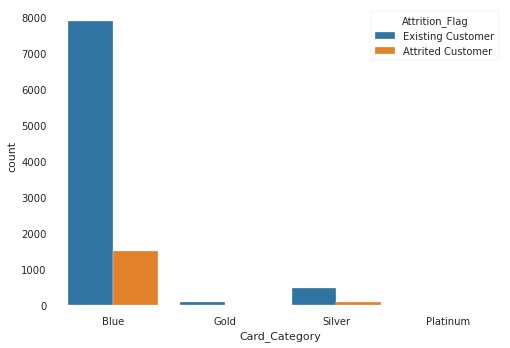

In [17]:
sns.countplot(x ='Card_Category', hue='Attrition_Flag', data=df)

Card Category and Income Category have roughly the same proportions in categories for Churn and Existing customers.
Let's have a look at Predictive Power Score matrix and discover if there are other than linear relationships between features and target variable.

In [18]:
pip install ppscore

     |████████████████████████████████| 47 kB 1.0 MB/s eta 0:00:011
  Created wheel for ppscore: filename=ppscore-1.2.0-py2.py3-none-any.whl size=13050 sha256=cbb6438a785f2ed051f0ffcaf40c5aa48525eb9f1be19ecc611b63d5cee6706d
  Stored in directory: /root/.cache/pip/wheels/d2/3c/58/2ff786414b21713edc6f4fdb54fdee89ac37bca5edd1f60634
Successfully built ppscore
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


<AxesSubplot:title={'center':'PPS matrix'}, xlabel='feature', ylabel='target'>

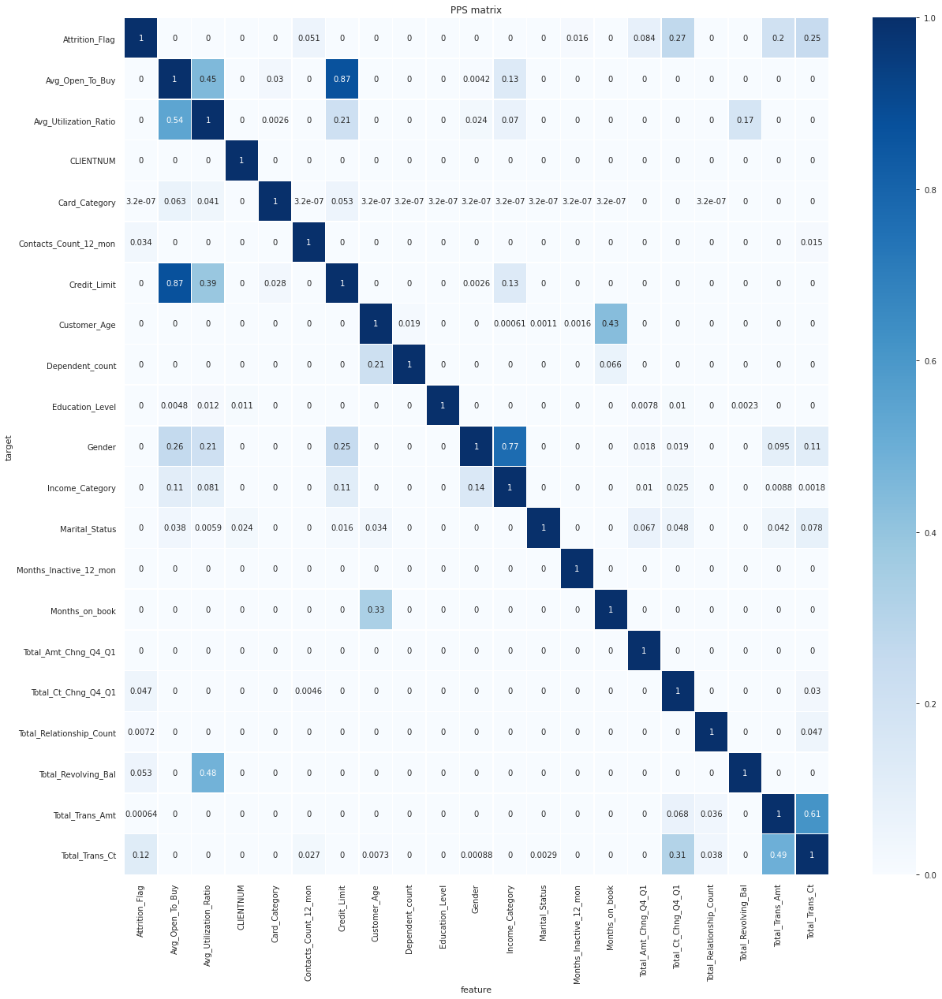

In [19]:
def heatmap(df):
    df = df[['x', 'y', 'ppscore']].pivot(columns='x', index='y', values='ppscore')
    fig, ax = plt.subplots(figsize=(20,20)) 
    ax = sns.heatmap(df, vmin=0, vmax=1, cmap="Blues", linewidths=0.5, annot=True)
    ax.set_title("PPS matrix")
    ax.set_xlabel("feature")
    ax.set_ylabel("target")
    return ax

import ppscore as pps
matrix = pps.matrix(df)
heatmap(matrix)

In [20]:
df.Attrition_Flag = df.Attrition_Flag.replace({'Attrited Customer':1,'Existing Customer':0})

In [21]:
#using Label Encoder for categorical features in case wewill use them for a model

for column in df.columns:
    if df[column].dtype == np.number:
        continue
    df[column] = LabelEncoder().fit_transform(df[column])
df.head(10)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: DeprecationWarning: Converting `np.inexact` or `np.floating` to a dtype is deprecated. The current result is `float64` which is not strictly correct.
  after removing the cwd from sys.path.


,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,7152,0,19,1,3,3,1,2,0,26,4,1,3,12691.0,324,11914.0,1.335,217,32,1.625,0.061
1,9812,0,23,0,5,2,2,4,0,31,5,1,2,8256.0,408,7392.0,1.541,338,23,3.714,0.105
2,3053,0,25,1,3,2,1,3,0,23,3,1,0,3418.0,0,3418.0,2.594,893,10,2.333,0.000
3,7204,0,14,0,4,3,3,4,0,21,2,4,1,3313.0,1973,796.0,1.405,236,10,2.333,0.760
4,501,0,14,1,3,5,1,2,0,8,4,1,0,4716.0,0,4716.0,2.175,65,18,2.500,0.000
5,2544,0,18,1,2,2,1,1,0,23,2,1,2,4010.0,785,2763.0,1.376,180,14,0.846,0.311
6,9493,0,25,1,4,6,1,0,1,33,5,1,3,34516.0,1767,32252.0,1.975,375,21,0.722,0.066
7,9818,0,6,1,0,3,3,2,3,14,1,2,2,29081.0,934,27685.0,2.204,568,26,0.714,0.048
8,1401,0,11,1,3,5,2,2,0,23,4,2,0,22352.0,1973,19835.0,3.355,395,14,1.182,0.113
9,5893,0,22,1,2,2,2,3,0,23,5,3,3,11656.0,1213,9979.0,1.524,480,22,0.882,0.144


In [22]:
#making a function for evaluation model results, using confusion_matrix, classification_report

def evaluate(y_actual, y_hat):
    matrix = confusion_matrix(y_actual, y_hat)

    sns.heatmap(pd.DataFrame(matrix), annot = True, cmap ='PuBu', fmt = 'g')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    
    labels = ['Existing', 'Churn']
    print(classification_report(y_actual, y_hat, target_names = labels))

In [23]:
#dropping categorical features
X = df.drop(['Attrition_Flag', 'CLIENTNUM', 'Education_Level', 'Credit_Limit', "Customer_Age", 
             'Dependent_count', 'Marital_Status','Card_Category', 'Gender', 'Income_Category'], axis = 1)
X = RobustScaler().fit_transform(X)
             
y = df['Attrition_Flag']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 42)

In [24]:
#set a proportion between negative and positive results for further usage in XGBoost
scale_num = int(y_train.value_counts().values[0]/y_train.value_counts().values[1])
scale_num

5

[11:11:39] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

    Existing       0.99      0.97      0.98      2543
       Churn       0.85      0.93      0.89       496

    accuracy                           0.96      3039
   macro avg       0.92      0.95      0.93      3039
weighted avg       0.96      0.96      0.96      3039



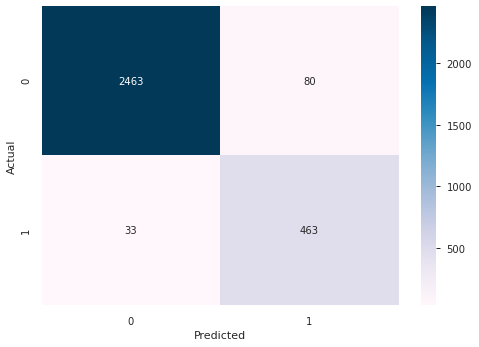

In [25]:
#modeling with handling imbalance in XGBoost 

xgb = XGBClassifier(n_estimators = 70, verbosity = 1, use_label_encoder=False, scale_pos_weight = scale_num)
xgb.fit(X_train, y_train)
predictions_xgb = xgb.predict(X_test)
evaluate(y_test, predictions_xgb)

In [26]:
#checking AUC score

fpr, tpr, thresholds = metrics.roc_curve(y_test, predictions_xgb)
auc = metrics.auc(fpr, tpr)
print(auc)

0.9510044175662477


Now let's try SMOTE - oversampling of positive samples to make equal quality of positive and negative examples

In [27]:
from imblearn.over_sampling import SMOTE
oversampler = SMOTE(random_state = 66)
x_train_smote, x_test_smote, y_train_smote, y_test_smote = train_test_split(X, y, test_size = 0.3,
                                                                            random_state = 66)
x_oversample, y_oversample = oversampler.fit_sample(x_train_smote, y_train_smote)
y_oversample.value_counts() 

0    5959
1    5959
Name: Attrition_Flag, dtype: int64

[11:11:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

    Existing       0.98      0.98      0.98      2541
       Churn       0.89      0.90      0.89       498

    accuracy                           0.97      3039
   macro avg       0.94      0.94      0.94      3039
weighted avg       0.97      0.97      0.97      3039



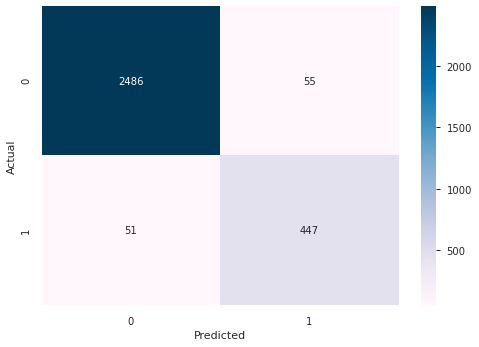

In [28]:
#modeling using XGBoost with smote sets and classical parameters
xgb_smote = XGBClassifier(use_label_encoder=False)
xgb_smote.fit(x_oversample, y_oversample)

predictions_smote = xgb_smote.predict(x_test_smote)
evaluate(y_test_smote, predictions_smote)

It seems SMOTE didn't improve the results with XGBoost, recall became even lower than it was before.
Time to try another classification algorithm - CatBoostClassifier.

              precision    recall  f1-score   support

    Existing       0.99      0.93      0.96      2543
       Churn       0.72      0.95      0.82       496

    accuracy                           0.93      3039
   macro avg       0.85      0.94      0.89      3039
weighted avg       0.95      0.93      0.93      3039



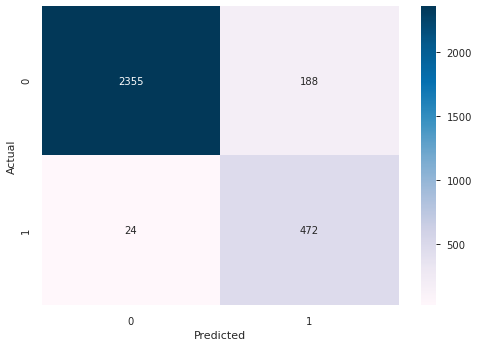

In [29]:
classifier = CatBoostClassifier(
    random_state=42, border_count=100,
    depth=6, iterations=100, l2_leaf_reg=100,
    learning_rate=0.1,auto_class_weights='Balanced',
    verbose=False
)

classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)
evaluate(y_test, y_pred)

In [30]:
fpr_cat, tpr_cat, thresholds_cat = metrics.roc_curve(y_test, y_pred)
auc = metrics.auc(fpr_cat, tpr_cat)
print(auc)

0.9388422361193917


**In the end, CatBoost did the best job. Recall 95% is pretty nice result for business in this case. Precision is very low - only 72%, but it is not very important here. Thank you for reading this notebook.**